# 1. BUSINESS UNDERSTANDING

## 1.1 THE PROBLEM

> Our client is an Insurance company that has provided Health Insurance to its customers now they need your help in building a model to predict whether the policyholders (customers) from past year will also be interested in Vehicle Insurance provided by the company.
>
> An insurance policy is an arrangement by which a company undertakes to provide a guarantee of compensation for specified loss, damage, illness, or death in return for the payment of a specified premium. A premium is a sum of money that the customer needs to pay regularly to an insurance company for this guarantee.
>
> Just like medical insurance, there is vehicle insurance where every year customer needs to pay a premium of certain amount to insurance provider company so that in case of unfortunate accident by the vehicle, the insurance provider company will provide a compensation (called ‘sum assured’) to the customer.


## 1.2 PROJECT GOAL

### 1.2.1 PROJECT GOAL

> Building a model to predict whether a customer would be interested in Vehicle Insurance is extremely helpful for the company because it can then accordingly plan its communication strategy to reach out to those customers and optimise its business model and revenue. 

### 1.2.2 CRITERIA FOR SUCCESSFUL PROJECT 

> Building a model to predict with acceptable accuracy for the classes (0 and 1), the metric for this problem is ROC_AUC score. 
>
> A good model should achieve an ROC_AUC score of 0.80 or higher

# 2. DATA UNDERSTANDING

## 2.1 DATA DESCRIPTION
> Now, in order to predict, whether the customer (health insurance policy holders) would be interested in Vehicle insurance, you have information about demographics (gender, age, region code type), Vehicles (Vehicle Age, Damage), Policy (Premium, sourcing channel) etc... in India
>
> The number of records in out data: **1 table, 381109 records with 12 fields.**
>
> Identities of fields:
>
> | variable | Definition|
  |----------|-----------|
  |id|Unique ID for the customer|
  |Gender|Gender of the customer|
  |Age|Age of the customer|
  |Driving_License|0 : Customer does not have DL, 1 : Customer already has DL|
  |Region_Code|Unique code for the region of the customer|
  |Previously_Insured|1 : Customer already has Vehicle Insurance, 0 : Customer doesn't have Vehicle Insurance|
  |Vehicle_Age|Age of the Vehicle|
  |Vehicle_Damage|1 : Customer got his/her vehicle damaged in the past. 0 : Customer didn't get his/her vehicle damaged in the past.|
  |Annual_Premium|The amount customer needs to pay as premium in the year|
  |Policy_Sales_Channel|Anonymized Code for the channel of outreaching to the customer ie. Different Agents, Over Mail, Over Phone, In Person, etc.|
  |Vintage|Number of Days, Customer has been associated with the company|
  |Response|1 : Customer is interested, 0 : Customer is not interested|

## 2.2 EXPLORATORY DATA ANALYSIS

**Import libraries**

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from plotly.subplots import make_subplots
import plotly.graph_objects as go
import plotly.express as px
from sklearn.preprocessing import StandardScaler, MinMaxScaler
#!pip install imbalanced-learn
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV, StratifiedKFold, KFold, cross_val_score
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import f1_score, roc_auc_score, accuracy_score, confusion_matrix, precision_score, recall_score, roc_curve, average_precision_score, precision_recall_curve

**Load data**

In [2]:
train_df = pd.read_csv('../input/health-insurance-cross-sell-prediction/train.csv')

**Inspect the shape of our data**

In [3]:
print(train_df.shape)

(381109, 12)


**Inspect data types**

In [4]:
train_df.dtypes

id                        int64
Gender                   object
Age                       int64
Driving_License           int64
Region_Code             float64
Previously_Insured        int64
Vehicle_Age              object
Vehicle_Damage           object
Annual_Premium          float64
Policy_Sales_Channel    float64
Vintage                   int64
Response                  int64
dtype: object

* Mostly our fields are in numeric types, except for Vehicle_Age, Vehicle_Damage, Gender are in string types

In [5]:
train_df.head()

,id,Gender,Age,Driving_License,Region_Code,Previously_Insured,Vehicle_Age,Vehicle_Damage,Annual_Premium,Policy_Sales_Channel,Vintage,Response
0,1,Male,44,1,28.0,0,> 2 Years,Yes,40454.0,26.0,217,1
1,2,Male,76,1,3.0,0,1-2 Year,No,33536.0,26.0,183,0
2,3,Male,47,1,28.0,0,> 2 Years,Yes,38294.0,26.0,27,1
3,4,Male,21,1,11.0,1,< 1 Year,No,28619.0,152.0,203,0
4,5,Female,29,1,41.0,1,< 1 Year,No,27496.0,152.0,39,0


**Check for null values**

In [6]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 381109 entries, 0 to 381108
Data columns (total 12 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   id                    381109 non-null  int64  
 1   Gender                381109 non-null  object 
 2   Age                   381109 non-null  int64  
 3   Driving_License       381109 non-null  int64  
 4   Region_Code           381109 non-null  float64
 5   Previously_Insured    381109 non-null  int64  
 6   Vehicle_Age           381109 non-null  object 
 7   Vehicle_Damage        381109 non-null  object 
 8   Annual_Premium        381109 non-null  float64
 9   Policy_Sales_Channel  381109 non-null  float64
 10  Vintage               381109 non-null  int64  
 11  Response              381109 non-null  int64  
dtypes: float64(3), int64(6), object(3)
memory usage: 34.9+ MB


In [7]:
numerical_col = ['Age', 'Region_Code','Annual_Premium','Vintage', 'Policy_Sales_Channel', 'Driving_License', 'Previously_Insured', 'Response']
categorical_col = ['Gender','Vehicle_Age','Vehicle_Damage']

**A quick statistics of fields in our data**

In [8]:
train_df[numerical_col].describe()

,Age,Region_Code,Annual_Premium,Vintage,Policy_Sales_Channel,Driving_License,Previously_Insured,Response
count,381109.000000,381109.000000,381109.000000,381109.000000,381109.000000,381109.000000,381109.000000,381109.000000
mean,38.822584,26.388807,30564.389581,154.347397,112.034295,0.997869,0.458210,0.122563
std,15.511611,13.229888,17213.155057,83.671304,54.203995,0.046110,0.498251,0.327936
min,20.000000,0.000000,2630.000000,10.000000,1.000000,0.000000,0.000000,0.000000
25%,25.000000,15.000000,24405.000000,82.000000,29.000000,1.000000,0.000000,0.000000
50%,36.000000,28.000000,31669.000000,154.000000,133.000000,1.000000,0.000000,0.000000
75%,49.000000,35.000000,39400.000000,227.000000,152.000000,1.000000,1.000000,0.000000
max,85.000000,52.000000,540165.000000,299.000000,163.000000,1.000000,1.000000,1.000000


* A quick look of our statistics, we can say that **Annual_Premium has outliers** with max value exceeds 1.5\*IQR, the highest premium is 540k ruppee. 
* Other fields don't have outliers 

**Categorical fields statistics**

In [9]:
train_df[categorical_col].describe()

,Gender,Vehicle_Age,Vehicle_Damage
count,381109,381109,381109
unique,2,3,2
top,Male,1-2 Year,Yes
freq,206089,200316,192413


### 2.2.1 DATA VISUALIZATION

Text(0.5, 1.0, 'Response_count')

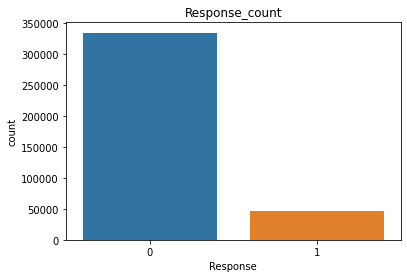

In [10]:
sns.countplot(data=train_df, x='Response')
plt.title('Response_count')

* We can see that **our dataset is heavily imbalanced in the target field**. With most of the values in class 0

Text(0.5, 1.0, 'Gender_count')

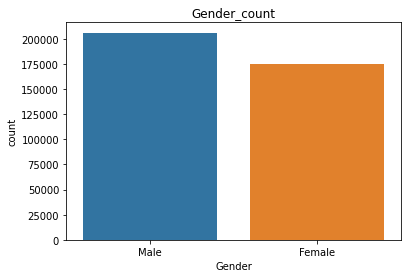

In [11]:
sns.countplot(data=train_df, x='Gender')
plt.title('Gender_count')

* A balanced Gender field

Text(0.5, 1.0, 'Driving_License_count')

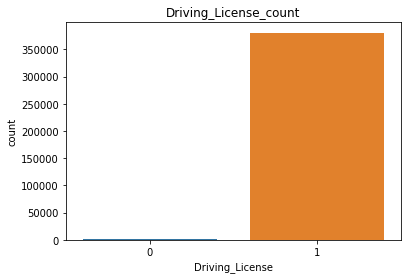

In [12]:
sns.countplot(data=train_df, x='Driving_License')
plt.title('Driving_License_count')

* Certainly, most of our customers must have driving license in order to drive a car. Few of our customers don have DL, maybe because they're underage, waiting to be egliable for a DL.

Text(0.5, 1.0, 'Previously_Insured_count')

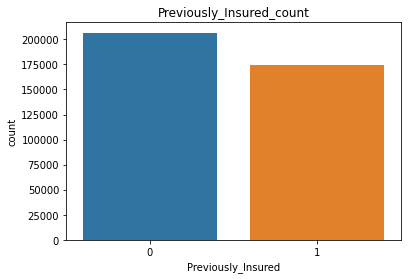

In [13]:
sns.countplot(data=train_df, x='Previously_Insured')
plt.title('Previously_Insured_count')

* A balanced Previously_insured field, slightly larger portion of our customers don't have vehicle insurance before. They can be our potential clients

Text(0.5, 1.0, 'Vehicle_Damage_count')

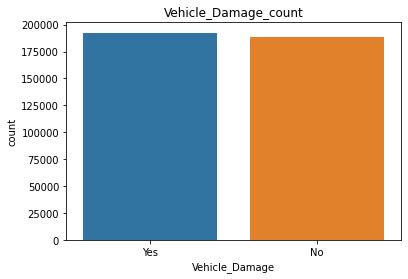

In [14]:
sns.countplot(data=train_df, x='Vehicle_Damage')
plt.title('Vehicle_Damage_count')

Text(0.5, 1.0, 'Vehicle_Age_count')

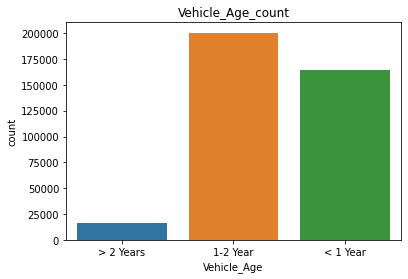

In [15]:
sns.countplot(data=train_df, x='Vehicle_Age')
plt.title('Vehicle_Age_count')

* Most of our clients own new cars (< 2 years of Vehicle Age). 
    - So our further findings will mostly reflect for customers who own new cars, it may not be true for old car (> 2 years) 

Text(0.5, 1.0, 'Annual_premium_distribution')

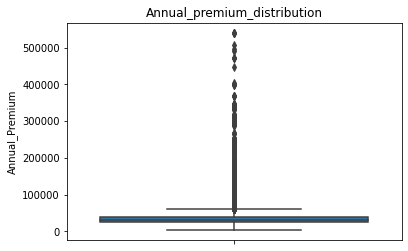

In [16]:
sns.boxplot(data=train_df, y='Annual_Premium')
plt.title('Annual_premium_distribution')

* Most of our clients are in a range of less than 100000 ruppee. Like our findings before that Annual_premium field has outliers, some of our clients pay high premium for their health insurance policies. 

Text(0.5, 1.0, 'Vintage_distribution')

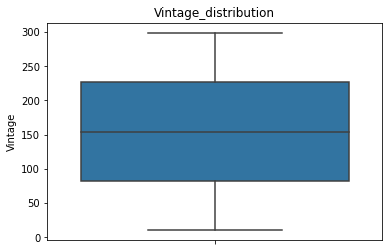

In [17]:
sns.boxplot(data=train_df, y='Vintage')
plt.title('Vintage_distribution')

* We have a balanced Vintage fields, with a wide range of days that customers associated with our company.

In [18]:
fig = px.histogram(train_df, x='Age')
fig.update_layout(height=500, width=500,
                  title_text="Age distribution with response")
fig.show()

* Our dataset mostly consists of young customers, a large portion of customers younger than 35. It can partially explains why most of our customers owns new cars, because of their young age (Maybe the first time they own a car).

In [19]:
fig = px.histogram(train_df, x='Region_Code')
fig.update_layout(height=500, width=500,
                  title_text="Region_Code distribution with response")
fig.show()

* Many of our customers came from a region with region code of 28, another region with high number of customers is region 8. It can be because these regions are high-income regions, so people are more willing to pay for an insurance policy

In [20]:
fig = px.histogram(train_df, x='Policy_Sales_Channel')
fig.update_layout(height=500, width=500,
                  title_text="Policy_Sales_Channel/Respones_distribution")
fig.show()

* Sales channels 26, 124 and 152 brought most of our customers. 
* A large portion of our customers are young people, I would say these channels are attracted to them.

<AxesSubplot:xlabel='Age', ylabel='Annual_Premium'>

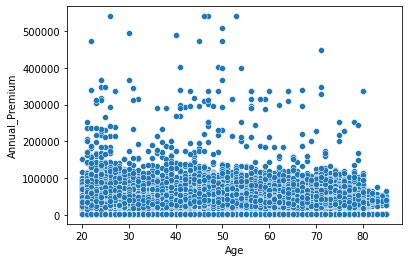

In [21]:
sns.scatterplot(x="Age", y="Annual_Premium", data=train_df)

* Interesting, older customers tends to pay less premium for health insurance policy. Maybe that can affect their interests in our company vehicle insurance

In [22]:
fig = px.histogram(train_df, x='Vintage', color='Response')
fig.update_layout(height=500, width=500,
                  title_text="Vintage/Respones_distribution")
fig.show()

* Another important finding is that whether they are a long-time customer or not, it doesn't affect their interest in our vehicle insurance

**An important question: what makes people more likely to be interested in our vehicle insurance?**

In [23]:
# df include response = 1
positive_df = train_df[train_df['Response']==1]
# df include response = 0
negative_df = train_df[train_df['Response']==0]

In [24]:
v_age_count_1 = positive_df.groupby(['Vehicle_Age'],as_index=False).count()[['Vehicle_Age','Response']]
v_age_count_0 = negative_df.groupby(['Vehicle_Age'],as_index=False).count()[['Vehicle_Age','Response']]

fig = make_subplots(rows=1, cols=2)

fig.add_trace(
    go.Bar(x=v_age_count_1['Vehicle_Age'], y=v_age_count_1['Response'], name='Interested'),
    row=1, col=1
)

fig.add_trace(
    go.Bar(x=v_age_count_0['Vehicle_Age'], y=v_age_count_0['Response'], name='Not interested'),
    row=1, col=2
)

fig.update_layout(height=600, width=800, title_text="\"Interested\" vs \"Not interested\" Vehicle_Age")
fig.show()

In [25]:
fig = go.Figure(data=[
    go.Bar(x=v_age_count_1['Vehicle_Age'], y=v_age_count_1['Response'], name='Interested'),
    go.Bar(x=v_age_count_0['Vehicle_Age'], y=v_age_count_0['Response'], name='Not Interested')
])
# Change the bar mode
fig.update_layout(barmode='stack', title_text="Vehicle_Age")
fig.show()

* We can see that among interested customers, most of them owns a car with vehicle age between 1-2 years

Text(0.5, 1.0, 'Annual_Premium (Not Interested)')

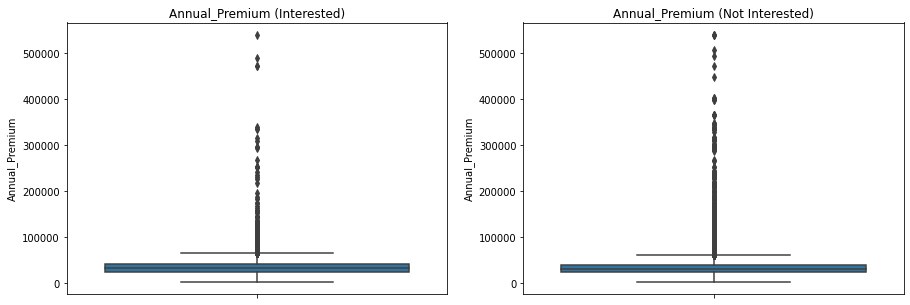

In [26]:
fig, ax = plt.subplots(1,2,figsize=(15,5))
sns.boxplot(data=positive_df, y='Annual_Premium', ax=ax[0])
ax[0].set_title('Annual_Premium (Interested)')

sns.boxplot(data=negative_df, y='Annual_Premium', ax=ax[1])
ax[1].set_title('Annual_Premium (Not Interested)')

* Annual premium doesn't affect our customers interests

In [27]:
fig = make_subplots(rows=1, cols=2)

fig.add_trace(
    go.Histogram(x=positive_df['Region_Code'], name='Interested'),
    row=1, col=1
)

fig.add_trace(
    go.Histogram(x=negative_df['Region_Code'], name='Not interested'),
    row=1, col=2
)

fig.update_layout(height=600, width=800, title_text="\"Interested\" vs \"Not interested\" Region_Code")
fig.show()

* Generally, most of our customers came from region 28, interested or not interested. So we should continue to focus on region 28 for potential clients. But the charts patterns of Interested and Not Interested quite similar, so we can say that **Region_code doesn't affect our customers interests**

Text(0.5, 1.0, 'Gender_count (Not Interested)')

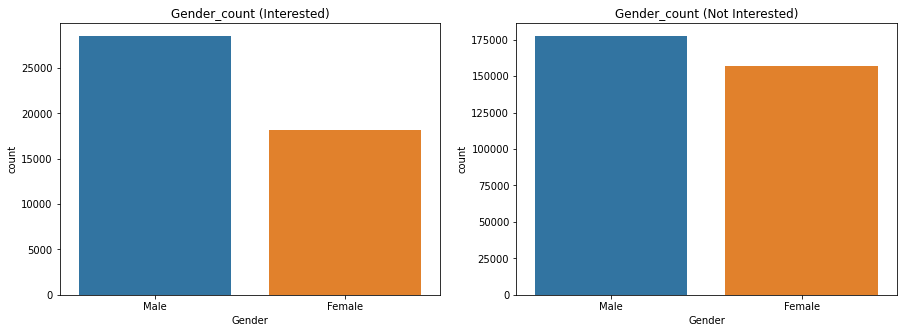

In [28]:
fig, ax = plt.subplots(1,2,figsize=(15,5))
sns.countplot(data=positive_df, x='Gender', ax=ax[0])
ax[0].set_title('Gender_count (Interested)')

sns.countplot(data=negative_df, x='Gender', ax=ax[1])
ax[1].set_title('Gender_count (Not Interested)')

* If we target Male clients, there is a slightly higher chance that they would be interested

Text(0.5, 1.0, 'Previously_Insured_count (Not Interested)')

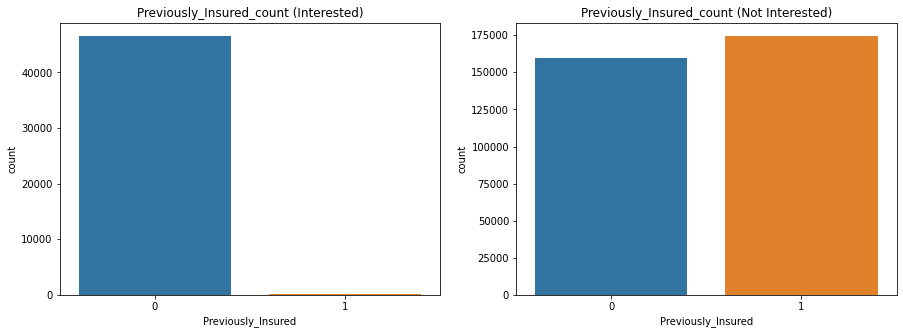

In [29]:
fig, ax = plt.subplots(1,2,figsize=(15,5))
sns.countplot(data=positive_df, x='Previously_Insured', ax=ax[0])
ax[0].set_title('Previously_Insured_count (Interested)')

sns.countplot(data=negative_df, x='Previously_Insured', ax=ax[1])
ax[1].set_title('Previously_Insured_count (Not Interested)')

* Almost all of our potential customers are customers who didn't have Vehicle Insurance before

Text(0.5, 1.0, 'Vehicle_Damage_count (0)')

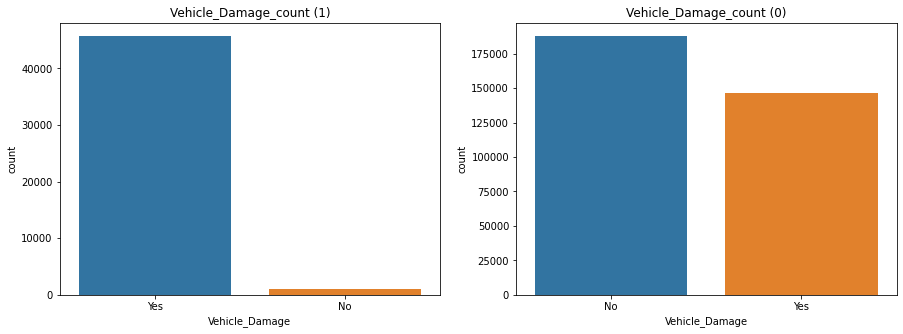

In [30]:
fig, ax = plt.subplots(1,2,figsize=(15,5))
sns.countplot(data=positive_df, x='Vehicle_Damage', ax=ax[0])
ax[0].set_title('Vehicle_Damage_count (1)')

sns.countplot(data=negative_df, x='Vehicle_Damage', ax=ax[1])
ax[1].set_title('Vehicle_Damage_count (0)')

* Another interesting finding, our potential customers are customers who did damage their car before

In [31]:
fig = make_subplots(rows=1, cols=2)

fig.add_trace(
    go.Histogram(x=positive_df['Age'], name='High positive'),
    row=1, col=1
)

fig.add_trace(
    go.Histogram(x=negative_df['Age'], name='low positive'),
    row=1, col=2
)

fig.update_layout(height=600, width=800, title_text="1 vs 0 Age distribution")
fig.show()

* We can see that a our potential customers age are around 28 - 60

In [32]:
fig = make_subplots(rows=1, cols=2)

fig.add_trace(
    go.Histogram(x=positive_df['Policy_Sales_Channel'], name='High positive'),
    row=1, col=1
)

fig.add_trace(
    go.Histogram(x=negative_df['Policy_Sales_Channel'], name='low positive'),
    row=1, col=2
)

fig.update_layout(height=600, width=800, title_text="1 vs 0 Policy_Sales_channel distribution")
fig.show()

* Lastly, our potential customers are mostly from sales channel 26 and 124

### 2.2.2 CONCLUSION

>1. Our dataset is imbalanced in target field, most of our customers are in class 0 (Not interested). 
>2. Most of them are young people, who owns new car and came from a specific region.
>3. They don't pay much premium for their insurance policy
>4. Who can be our potential customer?
    + A late 20s to 50s, male customer, who owns a car between 1-2 years of age.
    + Uninsured, did have vehicle damage before.
    + From region 28.
    + We can reach them by sales channel 26 or 124
    

### 2.2.3 MODEL PROPOSE

> We need to build a **class prediction model**, so I propose we use **classification method**: 
> - Simple model like **Logistics Regression**. Because our dataset is fairly large so we won't use SVM for faster performance
> - Ensemble model like **Random Forest, XGBoost and LightGBM**. 
> - Then we compare models and choose the best model for our problem

# 3. MODELING

## 3.1 DATA PREPROCESSING

In [33]:
train_df.drop(labels=['id'], axis=1, inplace=True)

In [34]:
train_df['Gender'] = train_df['Gender'].map({'Male': 1, 'Female': 0})
train_df['Vehicle_Damage'] = train_df['Vehicle_Damage'].map({'Yes': 1, 'No': 0})
train_df = pd.get_dummies(train_df, dtype=np.int64)

In [35]:
train_df = train_df.rename(columns={"Vehicle_Age_< 1 Year": "Vehicle_Age less than 1 Year",
                             "Vehicle_Age_> 2 Years": "Vehicle_Age over 2 Years"})

In [36]:
cols = train_df.columns.values.tolist()

In [37]:
cols = cols[:-4] + ['Vehicle_Age less than 1 Year', 'Vehicle_Age_1-2 Year', 'Vehicle_Age over 2 Years', 'Response']

In [38]:
train_df = train_df[cols]
train_df.head()

,Gender,Age,Driving_License,Region_Code,Previously_Insured,Vehicle_Damage,Annual_Premium,Policy_Sales_Channel,Vintage,Vehicle_Age less than 1 Year,Vehicle_Age_1-2 Year,Vehicle_Age over 2 Years,Response
0,1,44,1,28.0,0,1,40454.0,26.0,217,0,0,1,1
1,1,76,1,3.0,0,0,33536.0,26.0,183,0,1,0,0
2,1,47,1,28.0,0,1,38294.0,26.0,27,0,0,1,1
3,1,21,1,11.0,1,0,28619.0,152.0,203,1,0,0,0
4,0,29,1,41.0,1,0,27496.0,152.0,39,1,0,0,0


## 3.2 FEATURE SELECTION

<AxesSubplot:>

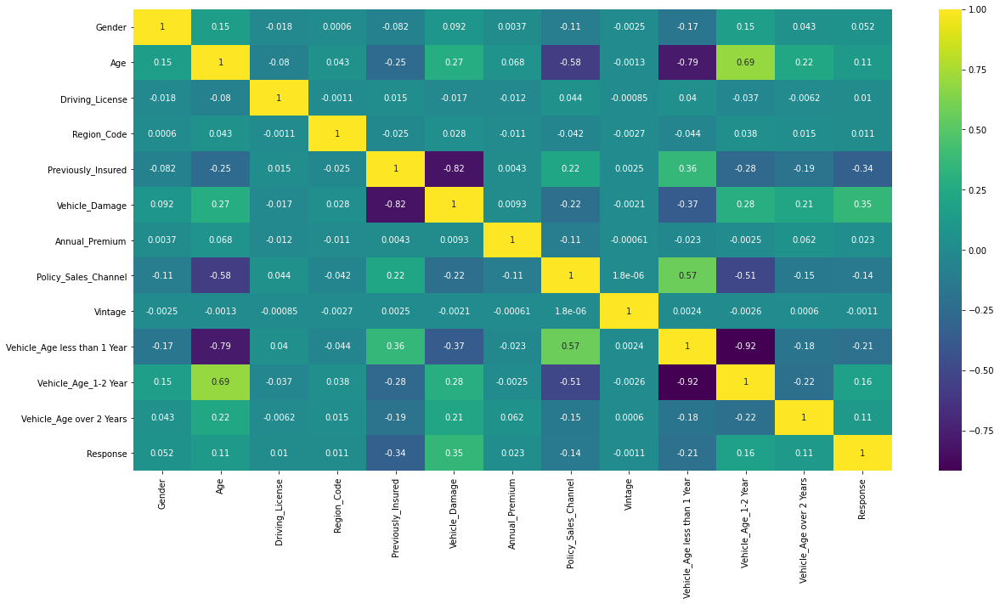

In [39]:
plt.figure(figsize=(20,10))
sns.heatmap(train_df.corr(), annot=True, cmap = 'viridis')

> From our findings above, we drop **Vintage, Annual_Premium, Region_Code, Gender** fields as these fields almost don't have any correlation with our target field
>
> We also drop **Driving_License** fields as almost all of our customers have DL 
>
> And since we have 3 columns for **Vehicle_Age**, we should drop 1 columns to simplify our dataset

In [40]:
y = np.asanyarray(train_df['Response'])
train_df.drop(labels=['Response', 'Vintage', 'Annual_Premium', 'Driving_License','Gender', 'Region_Code', 'Vehicle_Age less than 1 Year'], axis=1, inplace=True)

In [41]:
print('Kept features for model building:', train_df.columns.values)

Kept features for model building: ['Age' 'Previously_Insured' 'Vehicle_Damage' 'Policy_Sales_Channel'
 'Vehicle_Age_1-2 Year' 'Vehicle_Age over 2 Years']


## 3.3 SPLITTING DATASET FOR TRAINING AND TESTING

In [42]:
from sklearn.model_selection import train_test_split

In [43]:
mm_scaler = MinMaxScaler()
train_data = mm_scaler.fit_transform(train_df)
# splitting data with test_size of 0.25
X_train, X_test, y_train, y_test = train_test_split(train_data, y, test_size=0.25, random_state=9)

In [44]:
np.unique(y_train, return_counts=True)

(array([0, 1]), array([250828,  35003]))

In [45]:
print(X_train.shape)
print(X_test.shape)

(285831, 6)
(95278, 6)


## 3.4 Building model 

In [46]:
from sklearn.ensemble import RandomForestClassifier
import xgboost as xgb
import lightgbm as lgb
from hyperopt import STATUS_OK, Trials, fmin, hp, tpe

In [47]:
# train module
def train_model(model, X_train, y_train):
    print('Training model...')
    model.fit(X_train, y_train)
    print('Training finished.')
    return model

In [48]:
# test module
def test_model(model, algo, score, X_test, y_test, plot=False):
    print('Testing model...')
    y_score = model.predict_proba(X_test)
    y_pred = y_score[:, 1] > 0.5
    y_pred = y_pred.astype('int')
    
    # evaluation metric
    Roc_Auc_score = roc_auc_score(y_test, y_score[:,1])
    f1 = f1_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred)
    recall = recall_score(y_test, y_pred)
    fpr, tpr, thresholds = roc_curve(y_test, y_score[:,1], pos_label=1)
    
    print('Testing finished.', '\n', 'Test results:')
    print('     F1_score:', f1)
    print('     ROC_AUC score:', Roc_Auc_score)
    print('     Recall:', recall)
    print('     Precision:', precision)
    
    # save testing score to dictionary
    score['Precision'] = precision
    score['Recall'] = recall
    score['F1'] = f1
    score['ROC_AUC'] = Roc_Auc_score
    score['ROC_curve'] = [fpr, tpr, thresholds]
    
    # plotting confusion matrix
    if plot:
        cm = confusion_matrix(y_test, y_pred, normalize='true')
        sns.heatmap(cm, robust=True, 
                    vmin=cm.min(), vmax=cm.max(), annot=True, 
                    cmap='viridis', fmt='.2%') #fmt='.2%'
        plt.xlabel('Predicted labels')
        plt.ylabel('True labels')
        plt.title(algo + ' Confusion matrix', fontsize=13)
        plt.show()
    
    return score

In [49]:
# main module for training and testing model
def train_and_test_simple_model(algo='LR', train_data=(X_train, y_train), test_data=(X_test, y_test), testing=False, plot=False):
    
    score = {}
    
    (X_tr, y_tr) = train_data
    (X_t, y_t) = test_data
    
    # Logistic Regression model
    if algo == 'LR':
        score['Model'] = algo
        print('Logistic Regression model created')
        model = LogisticRegression()
        
        # Parameters tuning
        params = {'C': [C for C in np.linspace(0.01, 0.5, 5)], 
          'solver': ['newton-cg', 'lbfgs', 'liblinear'], 
          'max_iter': [100, 150, 200]}
        
        search = RandomizedSearchCV(estimator = model, 
                                    param_distributions = params, 
                                    n_iter=10, cv=3, 
                                    n_jobs=-1, 
                                    verbose=1, 
                                    random_state=9)
        
        print('Searching params for LR...')
        search.fit(X_tr, y_tr)
        
        print('Best params are:', search.best_params_)
        best_params = search.best_params_
        model = LogisticRegression(**best_params)
        
    # training model
    model = train_model(model, X_tr, y_tr)
    # testing model
    if testing:
        if plot:
            score = test_model(model, algo, score, X_t, y_t, plot=True)
        else:
            score = test_model(model, algo, score, X_t, y_t)
        return model, score
    else:
        return model

In [50]:
# main module for training and testing model
def train_and_test_ensemble_model(algo='RF', train_data=(X_train, y_train), test_data=(X_test, y_test), testing=False, plot=False):
    
    score = {}
    
    (X_tr, y_tr) = train_data
    (X_t, y_t) = test_data
    
    # Random Forest model
    if algo == 'RF':
        score['Model'] = algo
        print('Random Forest model created')
        model = RandomForestClassifier()
        
        # Parameters tuning
        params = {'criterion': ['entropy', 'gini'],
               'max_depth': [3,5,7,8,10],
               'min_samples_leaf': [5, 6, 7, 8],
               'min_samples_split': [6, 7, 8, 10],
               'n_estimators': [100, 200, 300]}
        
        RF_search = RandomizedSearchCV(estimator = model, 
                            param_distributions = params, 
                            n_iter=10, cv=3, 
                            n_jobs=-1, 
                            verbose=1, 
                            random_state=9)
        
        print('Searching params for RF...')
        RF_search.fit(X_tr, y_tr)
        
        print('Best params are:', RF_search.best_params_)
        best_params = RF_search.best_params_
        model = RandomForestClassifier(**best_params)
        
    # XGBoost Model    
    if algo == 'XGB':
        score['Model'] = algo
        
        params = { 'max_depth': hp.quniform("max_depth", 3,10,1),
        'gamma': hp.uniform ('gamma', 1,9),
        'reg_lambda' : hp.uniform('reg_lambda', 0,1),
        'learning_rate' : hp.loguniform("learning_rate",-4,-1),
        'colsample_bytree' : hp.uniform('colsample_bytree', 0.5,1),
        'min_child_weight' : hp.quniform('min_child_weight', 0, 10, 1),
        'n_estimators': 300,
        'seed': 9}
        
        print('XGBoost model created')
        
        # Parameters tuning
        
        # An optimization function
        def objective(space):
            clf=xgb.XGBClassifier(
                            n_estimators = params['n_estimators'], max_depth = params['max_depth'], 
                            gamma = params['gamma'], learning_rate = params['learning_rate'],
                            reg_lambda = params['reg_lambda'],
                            min_child_weight=params['min_child_weight'],
                            colsample_bytree=params['colsample_bytree'],
                            use_label_encoder=False)

            evaluation = [(X_tr, y_tr), (X_t, y_t)]

            clf.fit(X_tr, y_tr,
                    eval_set=evaluation, eval_metric="auc",
                    early_stopping_rounds=10,verbose=False)


            y_score = clf.predict_proba(X_t)[:,1]
            Roc_Auc_Score = roc_auc_score(y_t, y_score)
            return {'loss': -Roc_Auc_Score, 'status': STATUS_OK }
        
        # loggin
        trials = Trials()
        print('Searching params for XGB...')
        
        # tuning function
        best_params = fmin(fn = objective,
                            space = params,
                            algo = tpe.suggest,
                            max_evals = 100,
                            trials = trials,
                            rstate=np.random.RandomState(9))
        
        best_params['max_depth'] = int(best_params['max_depth'])
        print('Best params are:', best_params)
        model = xgb.XGBClassifier(**best_params, n_estimators=300, use_label_encoder=False)
        
    # LightGBM Model
    if algo == 'LGBM': 
        score['Model'] = algo
        
        params = {'n_estimators': hp.quniform('n_estimators', 100, 300, 1),
                   'max_depth' : hp.quniform('max_depth', 3, 10, 1),
                   'learning_rate': hp.loguniform("learning_rate",-4,-1),
                    'reg_lambda' : hp.uniform('reg_lambda',1.1,1.5),
                    'colsample_bytree' : hp.uniform('colsample_bytree', 0.5, 1),
                    'min_child_weight' : hp.quniform('min_child_weight', 0, 10, 1)}
        
        def gbm_objective(params):
            clf = lgb.LGBMClassifier(random_state = 9, n_estimators = int(params['n_estimators']), 
                                     max_depth = int(params['max_depth']), 
                                     learning_rate = params['learning_rate'],
                                     reg_lambda = params['reg_lambda'],
                                     min_child_weight = params['min_child_weight'],
                                     colsample_bytree = params['colsample_bytree'])

            evaluation = [(X_tr, y_tr), (X_t, y_t)]

            clf.fit(X_tr, y_tr,
                    eval_set=evaluation, eval_metric="auc",
                    early_stopping_rounds=10,verbose=False)


            y_score = clf.predict_proba(X_t)[:,1]
            Roc_Auc_Score = roc_auc_score(y_t, y_score)
            return {'loss': -Roc_Auc_Score, 'status': STATUS_OK }
        
        trials = Trials()
        print('Searching params for LGBM...')
        best_params = fmin(fn=gbm_objective, 
                           space=params, 
                           algo=tpe.suggest, 
                           max_evals=100, 
                           trials=trials,
                           rstate=np.random.RandomState(9))
        
        print('Best params are:', best_params)
        best_params['max_depth'] = int(best_params['max_depth'])
        best_params['n_estimators'] = int(best_params['n_estimators'])
        model = lgb.LGBMClassifier(random_state = 9, **best_params)
        
    # training model
    model = train_model(model, X_tr, y_tr)
    # testing model
    if testing:
        if plot:
            score = test_model(model, algo, score, X_t, y_t, plot=True)
        else:
            score = test_model(model, algo, score, X_t, y_t)
        return model, score
    else:
        return model

### 3.4.1 PARAMETER RANGE FOR MODELS
> We choose a optimized value for each parameter from a range of commonly used parameters for each model
>
> ***Parameters for LR model***: 
>```
params = {'C': [C for C in np.linspace(0.01, 0.5, 5)], 
          'solver': ['newton-cg', 'lbfgs', 'liblinear'], 
          'max_iter': [100, 150, 200]}
>```
<br>
<br>
>
> ***Parameters for Random Forest model***: 
>```
params = {'criterion': ['entropy', 'gini'],
          'max_depth': [3,5,7,8,10],
          'min_samples_leaf': [5, 6, 7, 8],
          'min_samples_split': [6, 7, 8, 10],
          'n_estimators': [100, 200, 300]}
>```
<br>
<br>
>
> ***Parameters for XGBoost model***:
>```
params = {'max_depth': integer from a range of [3, 18],
          'gamma': real number from a range of [1, 9],
          'reg_lambda' : real number from a range of [0, 1],
          'learning_rate' : real number from a range of [0.0001, 0.1],
          'colsample_bytree' : real number from a range of [0.5, 1],
          'min_child_weight' : real number from a range of [0, 10],
          'n_estimators': 300,
          'seed': 9} 
>```
<br>
<br>
>
> ***Parameters for LightGBM model***:
>```
params = {'n_estimators': integer from a range of [100, 300],
           'max_depth' : integer from a range of [3, 10],
           'learning_rate': real number from a range of [0.0001, 0.1],
           'reg_lambda' : real number from a range of [1.1, 1.5],
           'colsample_bytree' : real number from a range of [0.5, 1],
           'min_child_weight' : real number from a range of [0, 10]}
>```

### 3.4.2 TRAINING MODEL AND EVALUATION

#### LOGISTIC REGRESSION

Logistic Regression model created
Searching params for LR...
Fitting 3 folds for each of 10 candidates, totalling 30 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   13.2s finished


Best params are: {'solver': 'newton-cg', 'max_iter': 150, 'C': 0.5}
Training model...
Training finished.
Testing model...
Testing finished. 
 Test results:
     F1_score: 0.0
     ROC_AUC score: 0.8332629552526104
     Recall: 0.0
     Precision: 0.0


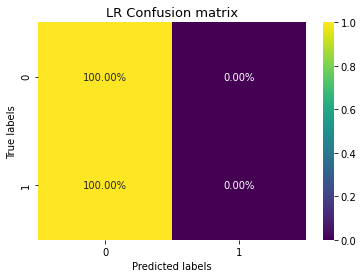

In [51]:
LR, LR_score = train_and_test_simple_model(algo='LR', testing=True, plot=True)

#### RANDOM FOREST

Random Forest model created
Searching params for RF...
Fitting 3 folds for each of 10 candidates, totalling 30 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:  5.6min finished


Best params are: {'n_estimators': 300, 'min_samples_split': 10, 'min_samples_leaf': 5, 'max_depth': 10, 'criterion': 'gini'}
Training model...
Training finished.
Testing model...
Testing finished. 
 Test results:
     F1_score: 0.002386634844868735
     ROC_AUC score: 0.8531850386410267
     Recall: 0.001195865721363287
     Precision: 0.56


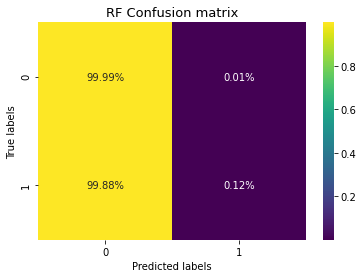

In [52]:
RF, RF_score = train_and_test_ensemble_model(testing=True, plot=True)

#### XGBOOST

XGBoost model created
Searching params for XGB...
100%|██████████| 100/100 [13:36<00:00,  8.17s/trial, best loss: -0.8541891386447495]
Best params are: {'colsample_bytree': 0.5964609590277307, 'gamma': 8.311016551983547, 'learning_rate': 0.16165817973064162, 'max_depth': 8, 'min_child_weight': 4.0, 'reg_lambda': 0.7714072029844901}
Training model...
[02:53:55] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Training finished.
Testing model...
Testing finished. 
 Test results:
     F1_score: 0.00017082336863682952
     ROC_AUC score: 0.8541828454968817
     Recall: 8.541898009737763e-05
     Precision: 1.0


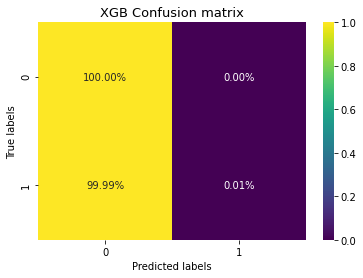

In [53]:
XGB_clf, XGB_score = train_and_test_ensemble_model(algo='XGB',testing=True, plot=True)

#### LIGHTGBM

Searching params for LGBM...
100%|██████████| 100/100 [12:06<00:00,  7.26s/trial, best loss: -0.8544713868887822]
Best params are: {'colsample_bytree': 0.6109573151423084, 'learning_rate': 0.0716633471750481, 'max_depth': 7.0, 'min_child_weight': 7.0, 'n_estimators': 300.0, 'reg_lambda': 1.4534955124271194}
Training model...
Training finished.
Testing model...
Testing finished. 
 Test results:
     F1_score: 0.009991532599491957
     ROC_AUC score: 0.8543705028325417
     Recall: 0.005039719825745281
     Precision: 0.5728155339805825


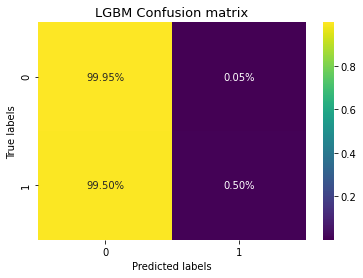

In [54]:
LGBM_clf, LGBM_score = train_and_test_ensemble_model(algo='LGBM', testing=True, plot=True)

#### MODEL EVALUATION

In [55]:
ensemble_score_table = {'Model': ['LR', 'RF', 'XGB', 'LGBM'], 
               'Precision': [LR_score['Precision'], RF_score['Precision'], XGB_score['Precision'], LGBM_score['Precision']],
               'Recall': [LR_score['Recall'], RF_score['Recall'], XGB_score['Recall'], LGBM_score['Recall']],
               'F1': [LR_score['F1'], RF_score['F1'], XGB_score['F1'], LGBM_score['F1']],
               'ROC_AUC': [LR_score['ROC_AUC'], RF_score['ROC_AUC'], XGB_score['ROC_AUC'], LGBM_score['ROC_AUC']]}

In [56]:
ensemble_score_df = pd.DataFrame(ensemble_score_table, index=ensemble_score_table['Model']).T
ensemble_score_df.drop(index='Model', inplace=True)
ensemble_score_df

,LR,RF,XGB,LGBM
Precision,0.0,0.56,1.0,0.572816
Recall,0.0,0.001196,0.000085,0.00504
F1,0.0,0.002387,0.000171,0.009992
ROC_AUC,0.833263,0.853185,0.854183,0.854371


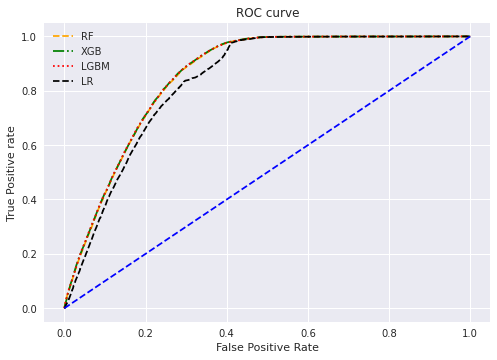

In [57]:
plt.style.use('seaborn')

# plot roc curves
plt.plot(RF_score['ROC_curve'][0], RF_score['ROC_curve'][1], linestyle='--',color='orange', label='RF')
plt.plot(XGB_score['ROC_curve'][0], XGB_score['ROC_curve'][1], linestyle='-.',color='green', label='XGB')
plt.plot(LGBM_score['ROC_curve'][0], LGBM_score['ROC_curve'][1], linestyle=':',color='red', label='LGBM')
plt.plot(LR_score['ROC_curve'][0], LR_score['ROC_curve'][1], linestyle='--',color='black', label='LR')

plt.plot((0,1), linestyle='--', color='blue')
# title
plt.title('ROC curve')
# x label
plt.xlabel('False Positive Rate')
# y label
plt.ylabel('True Positive rate')
plt.legend(loc='best')
plt.show()

#### CONCLUSION ON MODEL EVALUATION
> Based on our metric, we can see that our ensemble models perform better than our simple model LR (higher ROC_AUC score), so we **choose ensemble models**. But our 3 ensemble models achieve almost the same ROC_AUC score, so whichever we choose is good enough for our problem.
>
> But because of our imbalanced dataset. Out models perform poorly on positive examples (class 1) despite a high ROC_AUC score. We need to do some more data processing to overcome imbalance and make our models perform better on positive examples. 

# 4. IMPROVE MODEL

## 4.1 DEALING WITH IMBALANCED DATA

In [58]:
from imblearn.over_sampling import RandomOverSampler, SMOTE, SMOTENC
from imblearn.under_sampling import RandomUnderSampler, NearMiss
from imblearn.combine import SMOTEENN, SMOTETomek

> We use random oversampling and undersampling technique to generate more positive examples

In [59]:
oversampler = RandomOverSampler(sampling_strategy=0.15, random_state=0) 
undersampler = RandomUnderSampler(sampling_strategy=0.45, random_state=0)

X_train_resamp, y_train_resamp = oversampler.fit_resample(X_train, y_train)
X_train_resamp, y_train_resamp = undersampler.fit_resample(X_train_resamp, y_train_resamp)

In [60]:
values, counts = np.unique(y_train_resamp, return_counts=True)
for i in range(len(values)):
    print(f'Class {values[i]} count:  {counts[i]}')

Class 0 count:  83608
Class 1 count:  37624


Text(0.5, 1.0, 'Response_count')

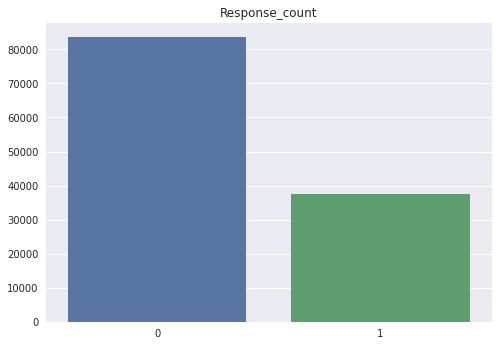

In [61]:
sns.barplot(x=values, y=counts)
plt.title('Response_count')

## 4.2 TRAINING, TESTING MODELS WITH NEW DATASET

### 4.2.1 TRAINING MODELS

In [62]:
import time

In [63]:
start_time = time.time()
RF_resamp = train_and_test_ensemble_model(algo='RF', train_data=(X_train_resamp, y_train_resamp))
print("Running time of RF on training dataset: %s seconds " % (time.time() - start_time))

Random Forest model created
Searching params for RF...
Fitting 3 folds for each of 10 candidates, totalling 30 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:  2.3min finished


Best params are: {'n_estimators': 300, 'min_samples_split': 10, 'min_samples_leaf': 5, 'max_depth': 10, 'criterion': 'gini'}
Training model...
Training finished.
Running time of RF on training dataset: 157.2657470703125 seconds 


In [64]:
start_time = time.time()
XGB_resamp = train_and_test_ensemble_model(algo='XGB', train_data=(X_train_resamp, y_train_resamp))
print("Running time of XGB on training dataset: %s seconds " % (time.time() - start_time))

XGBoost model created
Searching params for XGB...
100%|██████████| 100/100 [04:42<00:00,  2.83s/trial, best loss: -0.8536705053754557]
Best params are: {'colsample_bytree': 0.5964609590277307, 'gamma': 8.311016551983547, 'learning_rate': 0.16165817973064162, 'max_depth': 8, 'min_child_weight': 4.0, 'reg_lambda': 0.7714072029844901}
Training model...
[03:13:56] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Training finished.
Running time of XGB on training dataset: 294.6457848548889 seconds 


In [65]:
start_time = time.time()
LGBM_resamp = train_and_test_ensemble_model(algo='LGBM', train_data=(X_train_resamp, y_train_resamp))
print("Running time of LGBM on training dataset: %s seconds " % (time.time() - start_time))

Searching params for LGBM...
100%|██████████| 100/100 [05:40<00:00,  3.40s/trial, best loss: -0.854000272660827]
Best params are: {'colsample_bytree': 0.8598627868005149, 'learning_rate': 0.07633331302916507, 'max_depth': 4.0, 'min_child_weight': 7.0, 'n_estimators': 282.0, 'reg_lambda': 1.3955533606170245}
Training model...
Training finished.
Running time of LGBM on training dataset: 342.22259521484375 seconds 


#### EVALUATION

In [66]:
RF_resamp_score = {'Model': 'RF'}
XGB_resamp_score = {'Model': 'XGB'}
LGBM_resamp_score = {'Model': 'LGBM'}


start_time = time.time()
RF_resamp_score = test_model(RF_resamp, 'RF', RF_resamp_score, X_test, y_test, plot=False)
print("Running time of RF on test dataset: %s seconds " % (time.time() - start_time))
print('-----------------------', '\n',
     '-----------------------', '\n',
     '-----------------------', '\n')
start_time = time.time()
XGB_resamp_score = test_model(XGB_resamp, 'XGB', XGB_resamp_score, X_test, y_test, plot=False)
print("Running time of XGB on test dataset: %s seconds " % (time.time() - start_time))
print('-----------------------', '\n',
     '-----------------------', '\n',
     '-----------------------', '\n')
start_time = time.time()
LGBM_resamp_score = test_model(LGBM_resamp, 'LGBM', LGBM_resamp_score, X_test, y_test, plot=False)
print("Running time of LGBM on test dataset: %s seconds " % (time.time() - start_time))
print('-----------------------', '\n',
     '-----------------------', '\n',
     '-----------------------', '\n')

resamp_score_table = {'Model': ['RF', 'XGB', 'LGBM'], 
               'Precision': [RF_resamp_score['Precision'], XGB_resamp_score['Precision'], LGBM_resamp_score['Precision']],
               'Recall': [RF_resamp_score['Recall'], XGB_resamp_score['Recall'], LGBM_resamp_score['Recall']],
               'F1': [RF_resamp_score['F1'], XGB_resamp_score['F1'], LGBM_resamp_score['F1']],
               'ROC_AUC': [RF_resamp_score['ROC_AUC'], XGB_resamp_score['ROC_AUC'], LGBM_resamp_score['ROC_AUC']]}

Testing model...
Testing finished. 
 Test results:
     F1_score: 0.45372949551222524
     ROC_AUC score: 0.8526252024757978
     Recall: 0.7513453489365337
     Precision: 0.3249953814890079
Running time of RF on test dataset: 2.461905002593994 seconds 
----------------------- 
 ----------------------- 
 ----------------------- 

Testing model...
Testing finished. 
 Test results:
     F1_score: 0.45454308298333035
     ROC_AUC score: 0.8536138082731656
     Recall: 0.744170154608354
     Precision: 0.32719897844212426
Running time of XGB on test dataset: 0.2606024742126465 seconds 
----------------------- 
 ----------------------- 
 ----------------------- 

Testing model...
Testing finished. 
 Test results:
     F1_score: 0.4550705867115658
     ROC_AUC score: 0.8539950614192476
     Recall: 0.7503203211753652
     Precision: 0.32656703100602275
Running time of LGBM on test dataset: 0.898364782333374 seconds 
----------------------- 
 ----------------------- 
 -----------------------

In [67]:
resamp_score_df = pd.DataFrame(resamp_score_table, index=resamp_score_table['Model']).T
resamp_score_df.drop(index='Model', inplace=True)
resamp_score_df

,RF,XGB,LGBM
Precision,0.324995,0.327199,0.326567
Recall,0.751345,0.74417,0.75032
F1,0.453729,0.454543,0.455071
ROC_AUC,0.852625,0.853614,0.853995


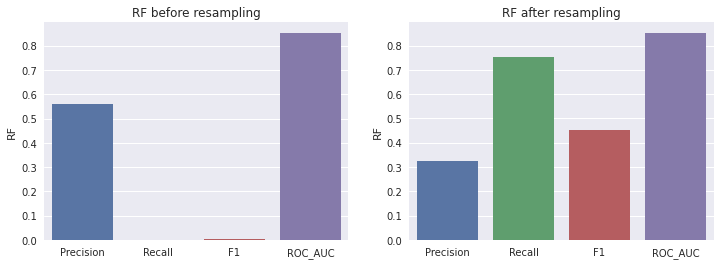

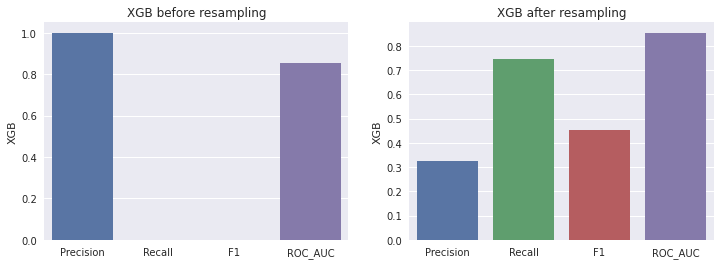

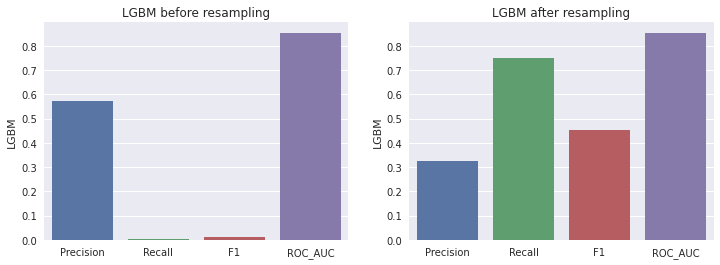

In [68]:
for col in resamp_score_df.columns.values.tolist():
    fig, ax = plt.subplots(1,2,figsize=(12,4))
    sns.barplot(y=col, x=ensemble_score_df.index, data=ensemble_score_df, ax=ax[0])
    ax[0].set_title(col + ' before resampling')
    
    sns.barplot(y=col, x=resamp_score_df.index, data=resamp_score_df, ax=ax[1])
    ax[1].set_title(col + ' after resampling')

#### CONCLUSION ON EVALUATION
> We can see that the ROC_AUC score of 3 ensemble models still around 0.85, but the models after resampling and re-training did a better job on predicting positive examples (class 1) on test data. Certainly after resampling, models precision decreased but the f1_score and recall increased. 
>
> Overall, the models perform better on both class 0 and 1, not only 0 class like before resampling data. 

# EXTRA

## CUSBoost
> Clustered-based undersampling with boosting (CUSBoost) is an algorithm proposed in the paper [Clustered-based undersampling with boosting for imbalanced classification](https://arxiv.org/pdf/1712.04356v1.pdf). 
>
> ([Authors codes](https://github.com/farshidrayhan-uom/CUSBoost))
>
>CUSBoost is based on the **combination of cluster-based sampling and Adaboost algorithm**. It separates the majority and minority class instances from the original dataset and clusters the majority class instances into *k* clusters using k-means clustering algorithm. Here, the parameter *k* is determined by hyperparameter optimisation. After that, random under-sampling is performed on each of the created clusters by randomly selecting 50% of the instances (but it can be tuned according
to the domain problem or dataset) and removing the rest. As clustering is used before sampling, theoretically this algorithm
will perform best when the dataset is highly cluster-able. These representative samples are then combined with the minority
class instances to obtain balanced datasets. The algorithm’s strength lies in the fact that it considers examples from all subspaces of the majority class, since k-means clustering puts each instance in some cluster. Other similar methods often fail
in obtaining proper representatives of the majority class.

In [69]:
from sklearn.ensemble import AdaBoostClassifier
from sklearn.cluster import KMeans
import math

### Implementing CUSboost to our dataset

In [70]:
# create a dataset resampler

def cus_sampler(X_train, y_train, number_of_clusters=23, percentage_to_choose_from_each_cluster=0.50):

    selected_idx = []
    selected_idx = np.asarray(selected_idx)

    value, counts = np.unique(y_train, return_counts=True)
    minority_class = value[np.argmin(counts)]
    majority_class = value[np.argmax(counts)]

    idx_min = np.where(y_train == minority_class)[0]
    idx_maj = np.where(y_train == majority_class)[0]

    majority_class_instances = X_train[idx_maj]
    majority_class_labels = y_train[idx_maj]

    kmeans = KMeans(n_clusters=number_of_clusters)
    kmeans.fit(majority_class_instances)

    X_maj = []
    y_maj = []

    points_under_each_cluster = {i: np.where(kmeans.labels_ == i)[0] for i in range(kmeans.n_clusters)}

    for key in points_under_each_cluster.keys():

        points_under_this_cluster = np.array(points_under_each_cluster[key])
        number_of_points_to_choose_from_this_cluster = math.ceil(
            len(points_under_this_cluster) * percentage_to_choose_from_each_cluster)




        selected_points = np.random.choice(points_under_this_cluster,
                                           size=number_of_points_to_choose_from_this_cluster, replace=False)
        X_maj.extend(majority_class_instances[selected_points])
        y_maj.extend(majority_class_labels[selected_points])

        selected_idx = np.append(selected_idx,selected_points)

        selected_idx = selected_idx.astype(int)

    selected_idx = np.append(selected_idx, idx_min)
    X_sampled = np.concatenate((X_train[idx_min], np.array(X_maj)))
    y_sampled = np.concatenate((y_train[idx_min], np.array(y_maj)))

    return X_sampled, y_sampled, selected_idx

In [71]:
class CUSBoostClassifier:
    def __init__(self, n_estimators, depth, number_of_clusters, percentage_to_choose_from_each_cluster):
        self.M = n_estimators
        self.depth = depth
        self.clusters = number_of_clusters
        self.pct_to_choose = percentage_to_choose_from_each_cluster

    def fit(self, X, Y):
        self.models = []
        self.alphas = []

        N, _ = X.shape
        W = np.ones(N) / N

        for m in range(self.M):
            tree = DecisionTreeClassifier(max_depth=self.depth, splitter='best')


            X_undersampled, y_undersampled, chosen_indices = cus_sampler(X,Y, self.clusters, self.pct_to_choose)


            tree.fit(X_undersampled, y_undersampled,
                     sample_weight=W[chosen_indices])

            P = tree.predict(X)

            err = np.sum(W[P != Y])

            if err > 0.5:
                m = m - 1
            if err <= 0:
                err = 0.0000001
            else:
                try:
                    if (np.log(1 - err) - np.log(err)) == 0 :
                        alpha = 0
                    else:
                        alpha = 0.5 * (np.log(1 - err) - np.log(err))
                    W = W * np.exp(-alpha * Y * P)  # vectorized form
                    W = W / W.sum()  # normalize so it sums to 1
                except:
                    alpha = 0
                    W = W * np.exp(-alpha * Y * P)  # vectorized form
                    W = W / W.sum()  # normalize so it sums to 1

                self.models.append(tree)
                self.alphas.append(alpha)

    def predict(self, X):
        N, _ = X.shape
        FX = np.zeros(N)
        for alpha, tree in zip(self.alphas, self.models):
            FX += alpha * tree.predict(X)
        return np.sign(FX), FX

    def predict_proba(self, X):
        proba = sum(tree.predict_proba(X) * alpha for tree , alpha in zip(self.models,self.alphas) )


        proba = np.array(proba)


        proba = proba / sum(self.alphas)

        proba = np.exp((1. / (2 - 1)) * proba)
        normalizer = proba.sum(axis=1)[:, np.newaxis]
        normalizer[normalizer == 0.0] = 1.0
        # proba =  np.linspace(proba)
        # proba = np.array(proba).astype(float)
        proba = proba /  normalizer

        return proba

best ROC:  0.8486969213667382  f1:  0.4411796577902686  for depth=  10  estimators =  10
best ROC:  0.8486969213667382  f1:  0.43501406317717795  for depth=  10  estimators =  10
best ROC:  0.8486969213667382  f1:  0.44059470423353464  for depth=  10  estimators =  10
best ROC:  0.8486969213667382  f1:  0.43925281959214163  for depth=  10  estimators =  10
Training and testing running time of CUSBoost : 2126.2657630443573 seconds 


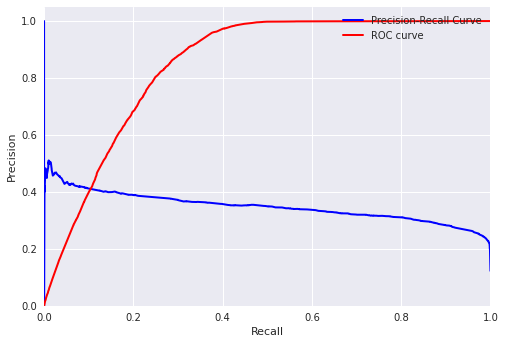

In [74]:
skf = StratifiedKFold(n_splits=5, shuffle=True)

top_auc = 0
mean_fpr = np.linspace(0, 1, 100)
max_depth = [10,12]
n_estimators = [10,15]


start_time = time.time()

for depth in max_depth:
    for estimators in n_estimators:

        current_param_auc = []
        current_param_f1 = []
        tprs = []

        for train_index, test_index in skf.split(train_data, y):
            X_train_ = train_data[train_index]
            X_test_ = train_data[test_index]

            y_train_ = y[train_index]
            y_test_ = y[test_index]


            classifier = CUSBoostClassifier(depth=depth, n_estimators=estimators, 
                                            number_of_clusters=25, percentage_to_choose_from_each_cluster=0.35)
    

            classifier.fit(X_train_, y_train_)

            predictions = classifier.predict_proba(X_test_)
            
            
            f1 = f1_score(y_test_, np.argmax(predictions, axis=1))
            
            auc = roc_auc_score(y_test_, predictions[:, 1])

            current_param_auc.append(auc)
            
            current_param_f1.append(f1)

            fpr, tpr, thresholds = roc_curve(y_test_, predictions[:, 1])
            tprs.append(np.interp(mean_fpr, fpr, tpr))
            tprs[-1][0] = 0.0

        current_mean_auc = np.mean(np.array(current_param_auc))
        current_mean_f1 = np.mean(np.array(current_param_f1))
        
        if top_auc < current_mean_auc:
            top_auc = current_mean_auc

            best_depth = depth
            best_estimators = estimators

            best_auc = top_auc
            best_tpr = np.mean(tprs, axis=0)
            best_fpr = mean_fpr

            best_precision, best_recall, _ = precision_recall_curve(y_test_, predictions[:, 1])
            best_fpr, best_tpr, thresholds = roc_curve(y_test_, predictions[:, 1])


        print('best ROC: ', top_auc, ' f1: ', current_mean_f1, ' for depth= ', best_depth, ' estimators = ', best_estimators)

        
print("Training and testing running time of CUSBoost : %s seconds " % (time.time() - start_time))        
        
plt.plot(best_recall, best_precision, lw=2, color='Blue',
         label='Precision-Recall Curve')
plt.plot(best_fpr, best_tpr, lw=2, color='red',
         label='ROC curve')

plt.xlabel('Recall')
plt.ylabel('Precision')
plt.ylim([0.0, 1.05])
plt.xlim([0.0, 1.0])
plt.legend(loc="upper right")
plt.show()



#### WHICH MODEL SHOULD WE CHOOSE FOR OUR PROBLEM?
> We can see that XGB and LGBM models perform better than other models. And XGB has the fastest runtime, so we choose XGBoost model.